In [1]:
from sqlite3 import SQLITE_CREATE_VIEW
import anndata
import scanpy as sc
import os
#from bbknn import bbknn
import matplotlib.pyplot as plt
import omicverse as ov
#import scib
from scvi.model.utils import mde
#from scib_metrics.benchmark import Benchmarker
import scvi
#import scanorama
import numpy as np
#import pyliger
#from harmony import harmonize
from rich import print
import seaborn as sns
#import bbknn
#import doubletdetection
%matplotlib inline
import pandas as pd

plt.rcParams.update({'font.size': 12})
plt.rcParams['pdf.fonttype'] = 42  # Ensures that fonts are saved as text, not outlines
#plt.rcParams['font.sans-serif'] = ['Arial']  # Use Arial or another common font
# Change the font to 'DejaVu Sans' or another available font
plt.rcParams['font.sans-serif'] = ['DejaVu Sans']
plt.rcParams['font.family'] = 'sans-serif'


   ____            _     _    __                  
  / __ \____ ___  (_)___| |  / /__  _____________ 
 / / / / __ `__ \/ / ___/ | / / _ \/ ___/ ___/ _ \ 
/ /_/ / / / / / / / /__ | |/ /  __/ /  (__  )  __/ 
\____/_/ /_/ /_/_/\___/ |___/\___/_/  /____/\___/                                              

Version: 1.5.3, Tutorials: https://omicverse.readthedocs.io/


[rank: 0] Global seed set to 0


In [2]:
#####Change path and Load data
os.chdir("/storage/liuxiaodongLab/fanxueying/mayanalysis/2024Aug")
adata = anndata.read_h5ad("human_reanno.h5ad")

In [3]:
adata

AnnData object with n_obs × n_vars = 33599 × 60421
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'sample', 'stage', 'percent.mt', 'species', 'embryo', 'platform', 'ann_level_2', 'ann_level_3', 'ann_level_1', 'doublet', 'doublet_score', 'Unintegrated_res_0.5', 'Scanorama_res_0.5', 'LIGER_res_0.5', 'Harmony_res_0.5', 'scVI_res_0.5', 'scANVI_res_0.5', 'CCA_res_0.5', 'FastMNN_res_0.5', 'leiden_1', 'leiden_2', 'leiden_3', 'leiden_4', 'reanno'
    var: 'features', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'highly_variable_nbatches', 'highly_variable_intersection'
    uns: 'CCA_res_0.5_colors', 'FastMNN_res_0.5_colors', 'Harmony_res_0.5_colors', 'LIGER_res_0.5_colors', 'Scanorama_res_0.5_colors', 'Unintegrated_res_0.5_colors', 'anno_colors', 'harmo.anno_colors', 'hvg', 'leiden', 'leiden_3_colors', 'log1p', 'neighbors', 'orig.ident_colors', 'pca', 'reanno_colors', 'scANVI_res_0.5_colors', 'scVI_res_0.5_colors', 'stage_colors', 'sub_anno_colors', 'umap'
  

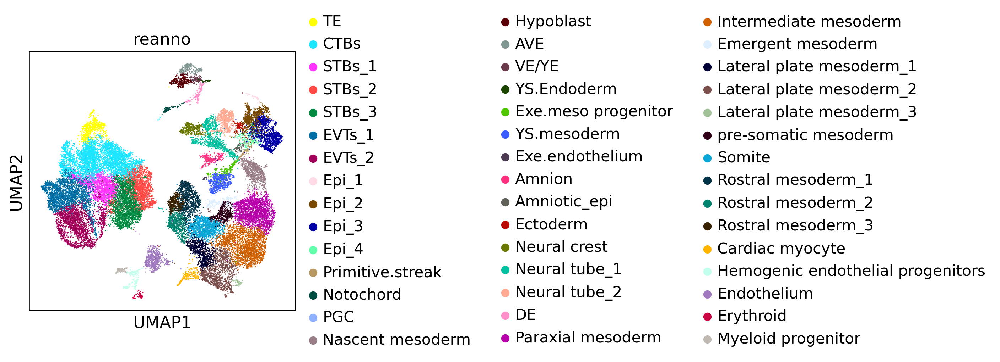

In [4]:
sc.pl.umap(adata, color=['reanno'])

In [5]:
# Define the desired order of the stages
stage_order = ["E6", "E6_IVC", "E7_IVC", "E8_IVC", "E9_IVC", "E10_IVC",
               "E11_IVC", "E12_IVC", "E13_IVC", "E14_IVC",
               "CS7", "CS10"]

# Convert the 'stage' column to a categorical type with the specified order
adata.obs['stage'] = pd.Categorical(adata.obs['stage'], categories=stage_order, ordered=True)

In [6]:
#define lineages
# Define lineages
lineages = {
    'TE_TrB': ['TE', 'CTBs', 'STBs_1','STBs_2','STBs_3', 'EVTs_1', 'EVTs_2', ],
    'epi': [ 'Epi_1','Epi_2','Epi_3','Epi_4',],
    'Gastru': ['Primitive.streak', 'Nascent mesoderm'],
    'Notochord': ['Notochord'],
    'PGC': ['PGC'],
    'ExE_endo': ['Hypoblast', 'AVE','VE/YE','YS.Endoderm', ],
    'Exe_meso': [ 'Exe.meso progenitor', 'YS.mesoderm',  'Exe.endothelium'],
    'non_neuro_ecto': ['Amnion', 'Amniotic_epi', 'Ectoderm'],
    'neural_ecto': ['Neural crest','Neural tube_1', 'Neural tube_2'],
    'Endoderm': ['DE', ],
    'mesoderm': ['Paraxial mesoderm','Intermediate mesoderm','Emergent mesoderm',
                  'Lateral plate mesoderm_1','Lateral plate mesoderm_2','Lateral plate mesoderm_3',
                  'pre-somatic mesoderm','Somite',
                  'Rostral mesoderm_1','Rostral mesoderm_2',
                  'Rostral mesoderm_3', 'Cardiac myocyte', ],
    'hemogenic': ['Hemogenic endothelial progenitors', 'Endothelium', 'Erythroid','Myeloid progenitor', ],

    
    
}

# Create a new column 'lineage' with default values
adata.obs['lineage'] = 'Unknown'

# Loop through each lineage and assign the corresponding cells
for lineage, annotations in lineages.items():
    adata.obs.loc[adata.obs['reanno'].isin(annotations), 'lineage'] = lineage

# Save the updated AnnData object if needed
# adata.write('path_to_save/adata_with_lineage.h5ad')

# Verify the changes
adata.obs['lineage'].value_counts()


TE_TrB            14847
mesoderm          10431
epi                2246
neural_ecto        1937
hemogenic          1009
Exe_meso            862
Gastru              843
ExE_endo            695
non_neuro_ecto      463
Endoderm            162
Notochord            93
PGC                  11
Name: lineage, dtype: int64

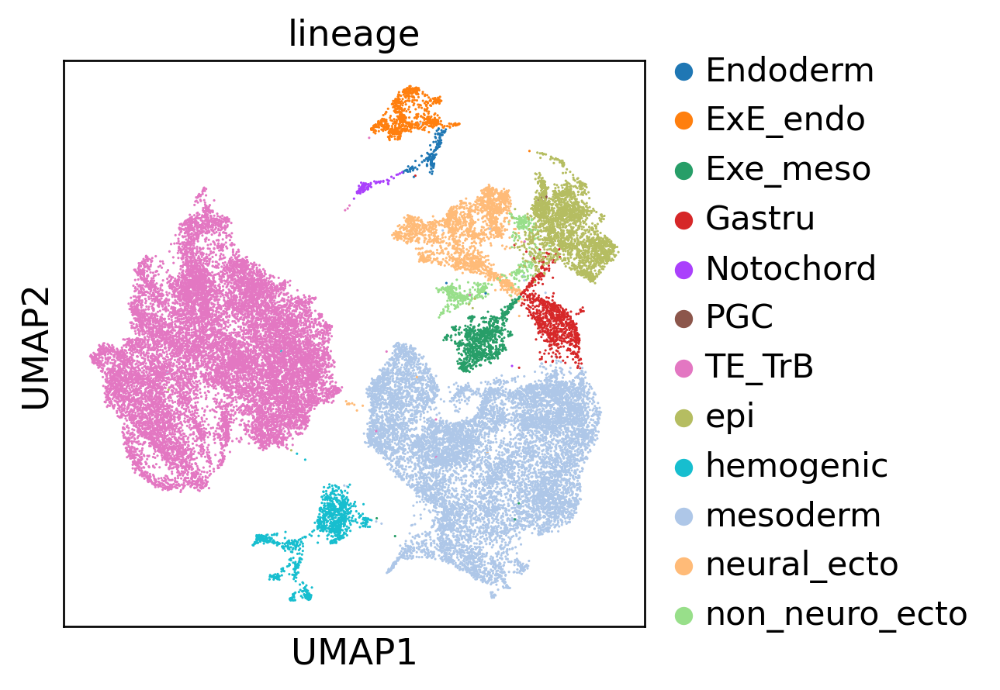

In [7]:
sc.pl.umap(adata, color=['lineage'])

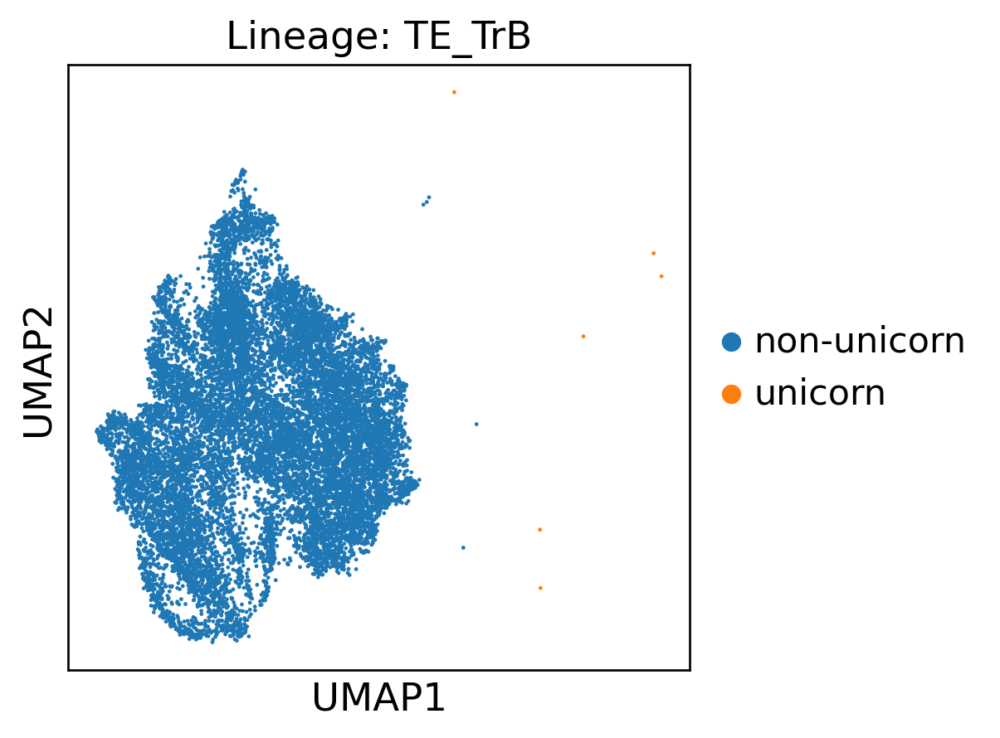

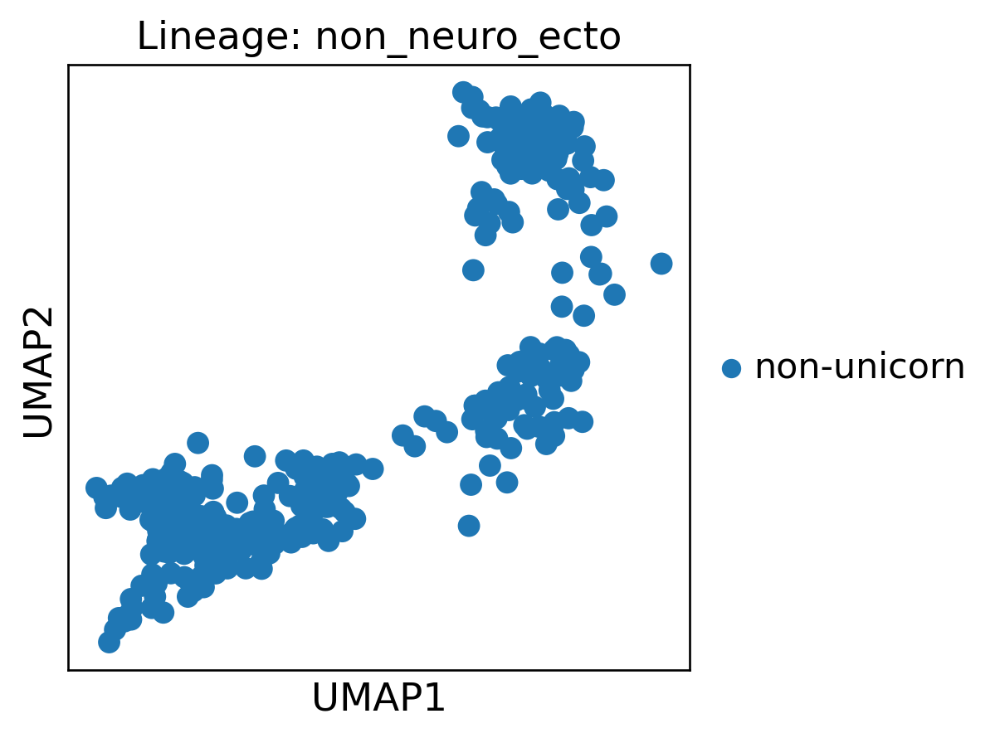

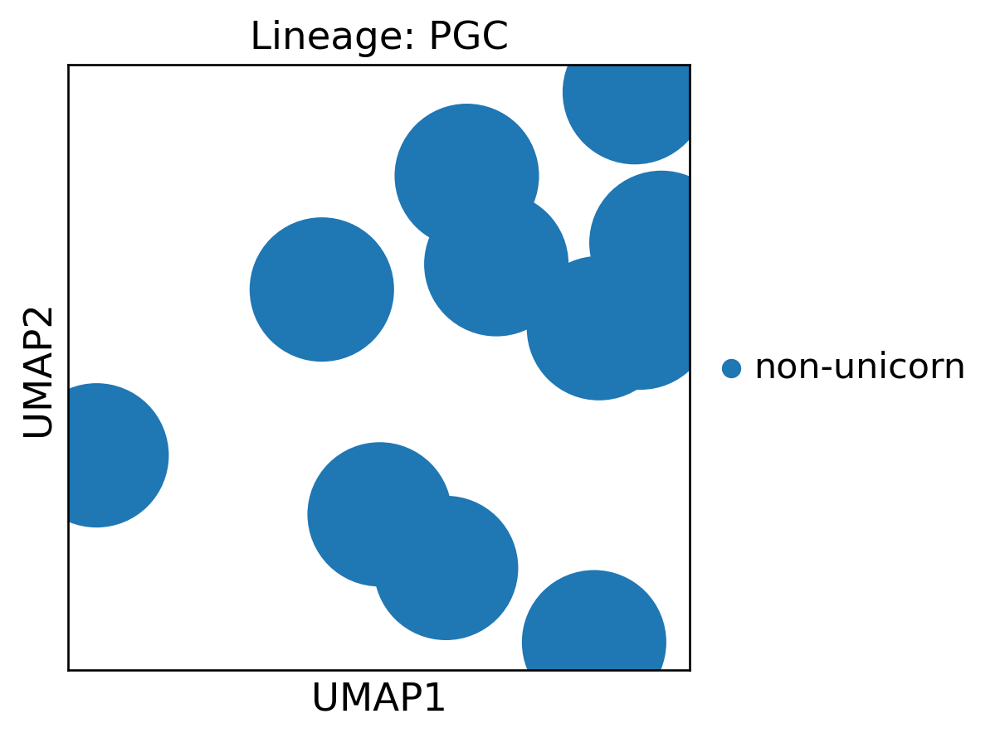

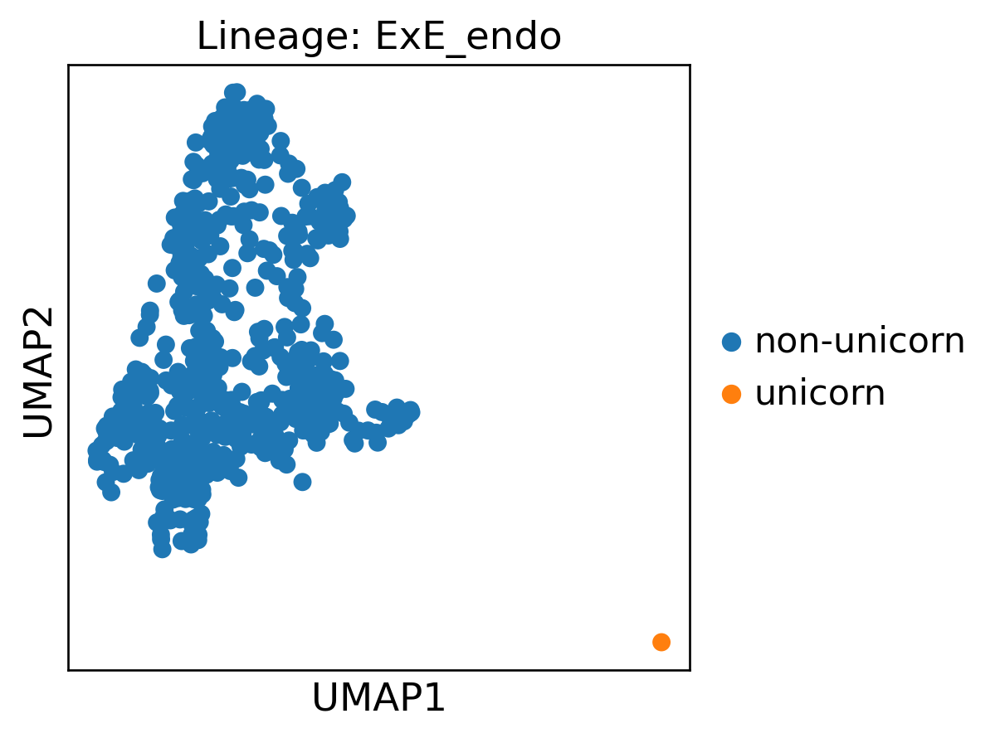

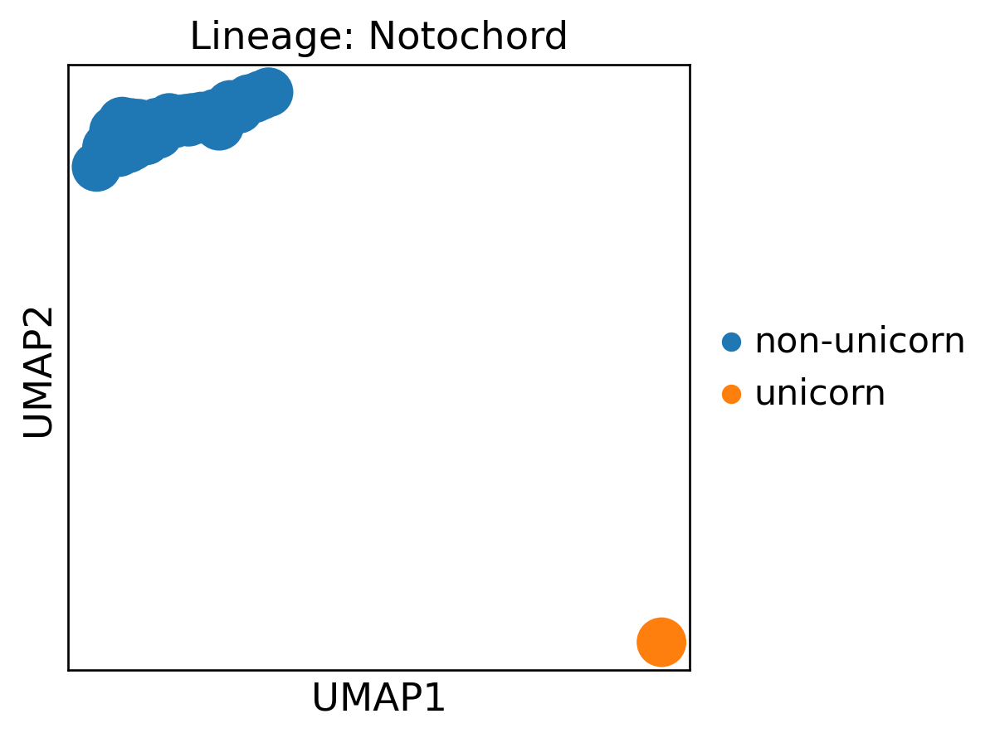

...

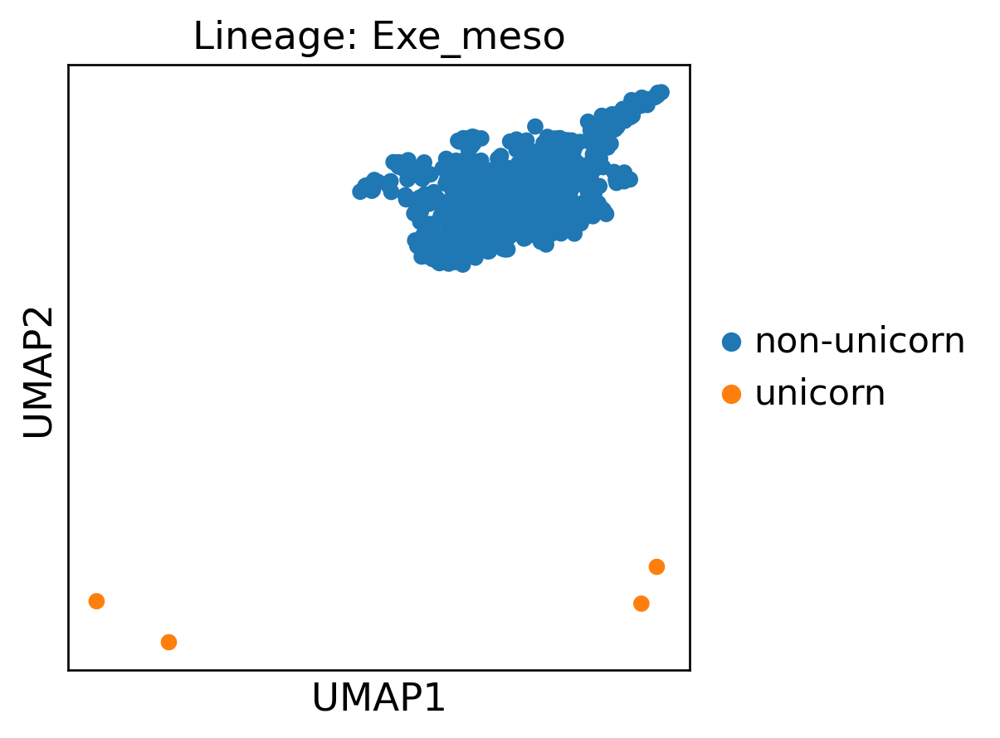

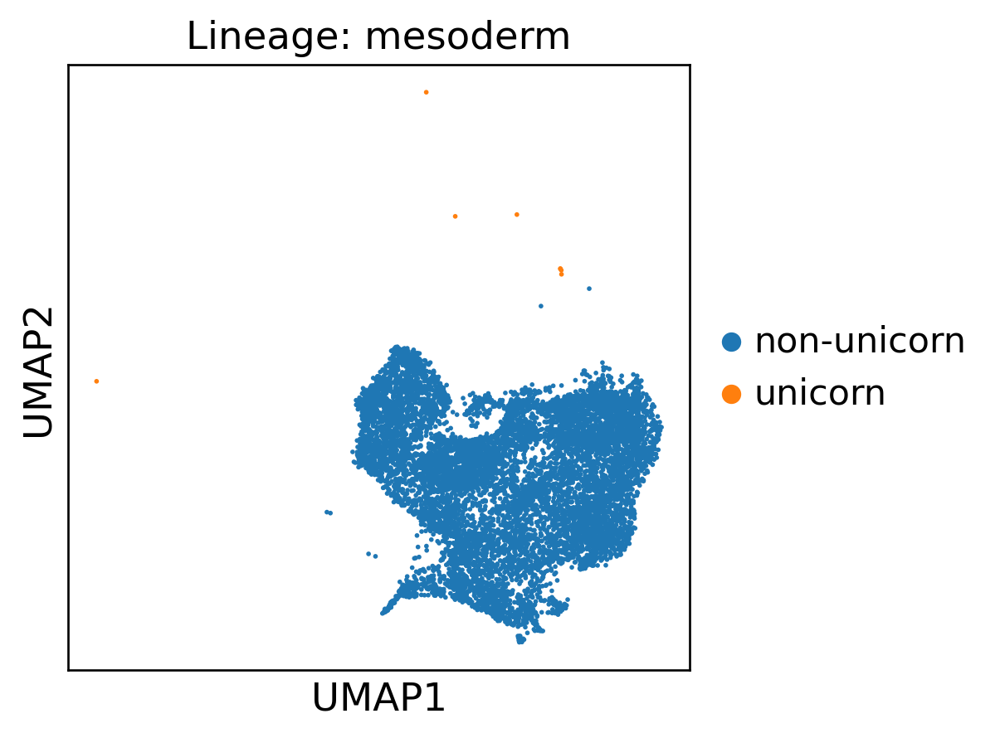

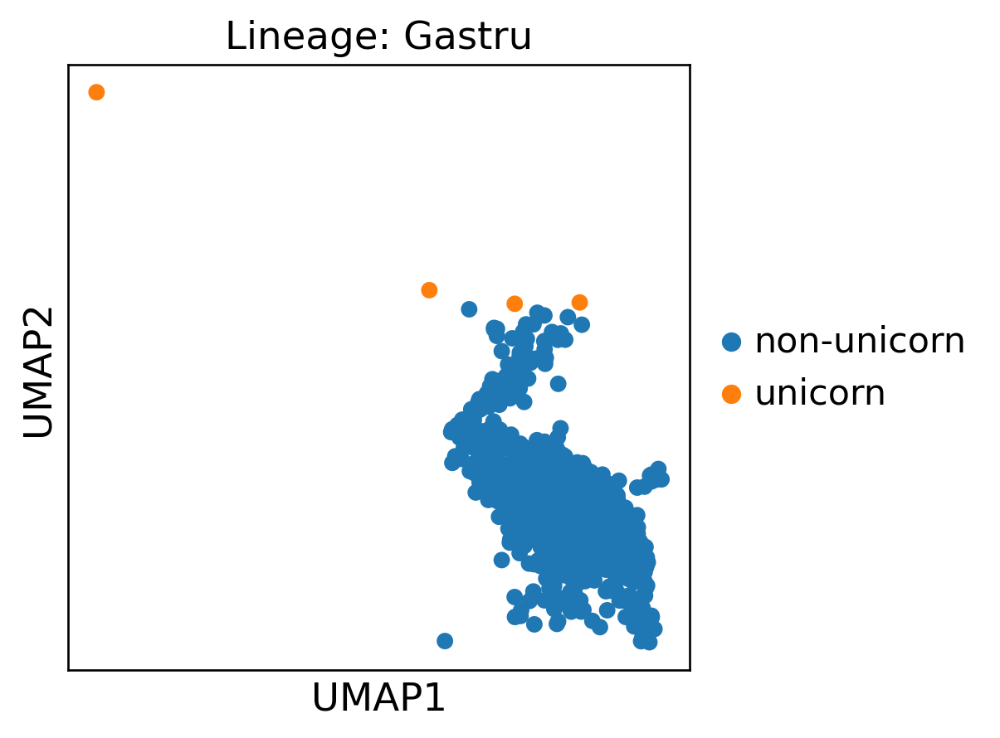

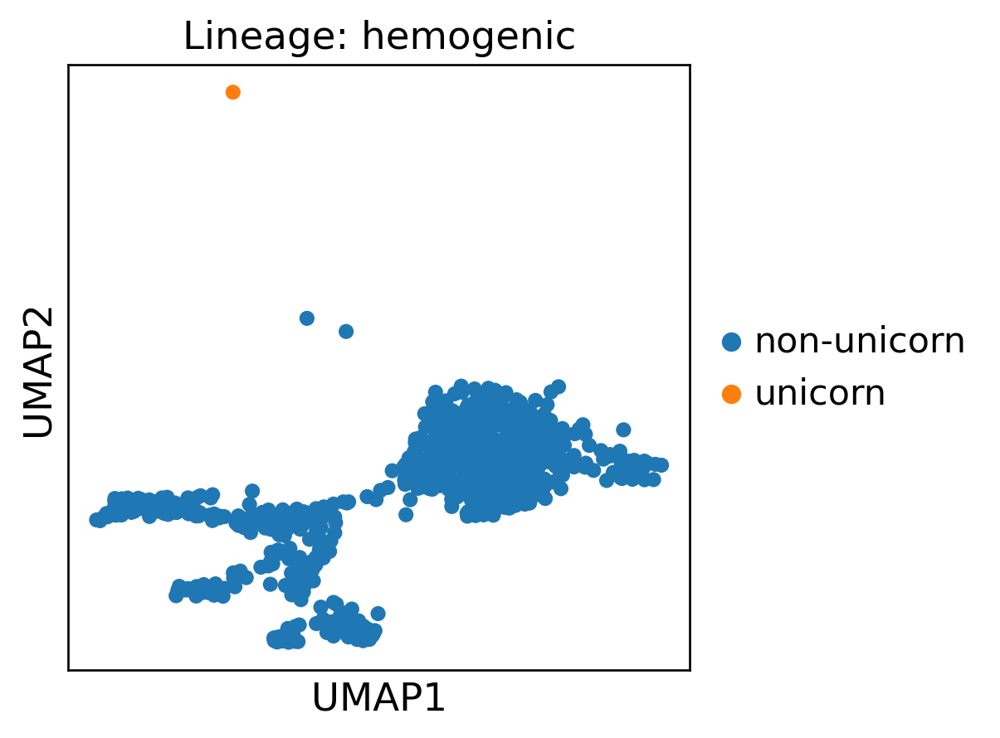

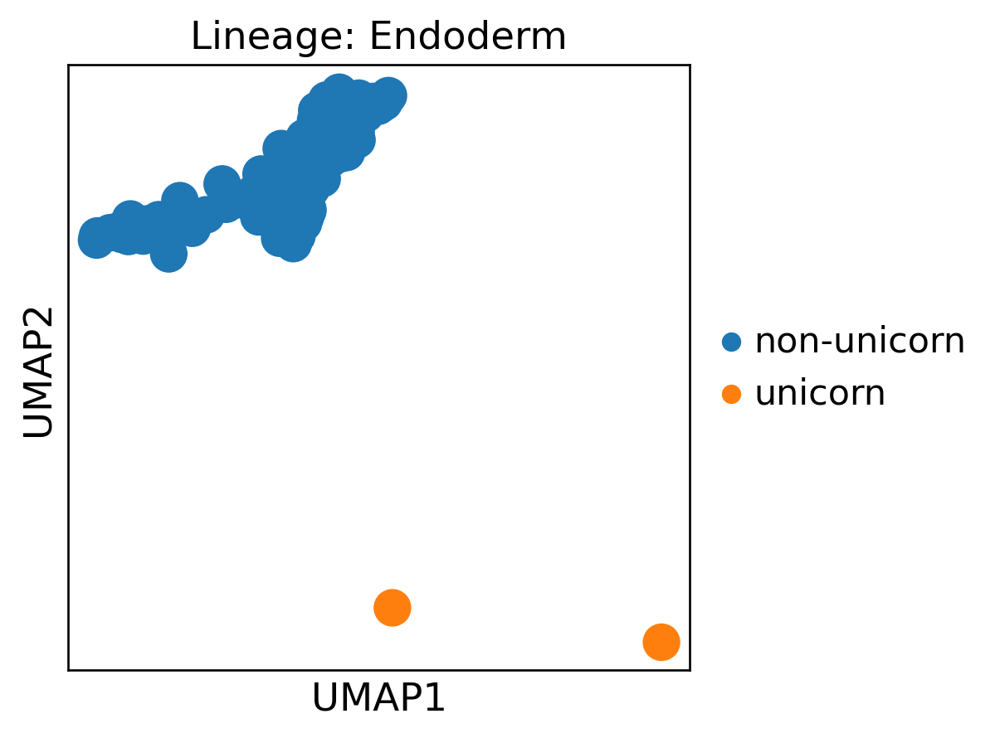

In [8]:
#identify unicorns which are located far away from the main population
from scipy.stats import zscore

# List of lineages to process
lineages = set(adata.obs.lineage)

# Initialize the 'unicorns' column in the main adata if it doesn't exist
if 'unicorns' not in adata.obs.columns:
    adata.obs['unicorns'] = 'non-unicorn'

# Threshold for identifying outliers
threshold = 3

# Loop through each lineage
for lineage in lineages:
    # Subset the data based on the current lineage
    ana_sub = adata[adata.obs['lineage'].isin([lineage])]
    
    # Get the UMAP coordinates
    umap_coords = ana_sub.obsm['X_umap']
    
    # Calculate z-scores for the UMAP coordinates
    z_scores_umap = np.abs(zscore(umap_coords, axis=0))
    
    # Create a boolean mask for outliers based on the threshold in both UMAP1 and UMAP2
    outlier_condition = (z_scores_umap[:, 0] > threshold) | (z_scores_umap[:, 1] > threshold)
    
    # Initialize all as 'non-unicorn'
    ana_sub.obs['unicorns'] = 'non-unicorn'
    
    # Update the 'unicorns' label for the outliers
    ana_sub.obs.loc[ana_sub.obs.index[outlier_condition], 'unicorns'] = 'unicorn'
    
    # Optional: Plot to verify for each lineage
    sc.pl.umap(ana_sub, color='unicorns', title=f'Lineage: {lineage}')
    
    # Update the main adata object with the 'unicorns' label from ana_sub
    adata.obs.loc[ana_sub.obs.index, 'unicorns'] = ana_sub.obs['unicorns']

# After the loop, the 'unicorns' labels in the main adata will be updated for the specified lineages.


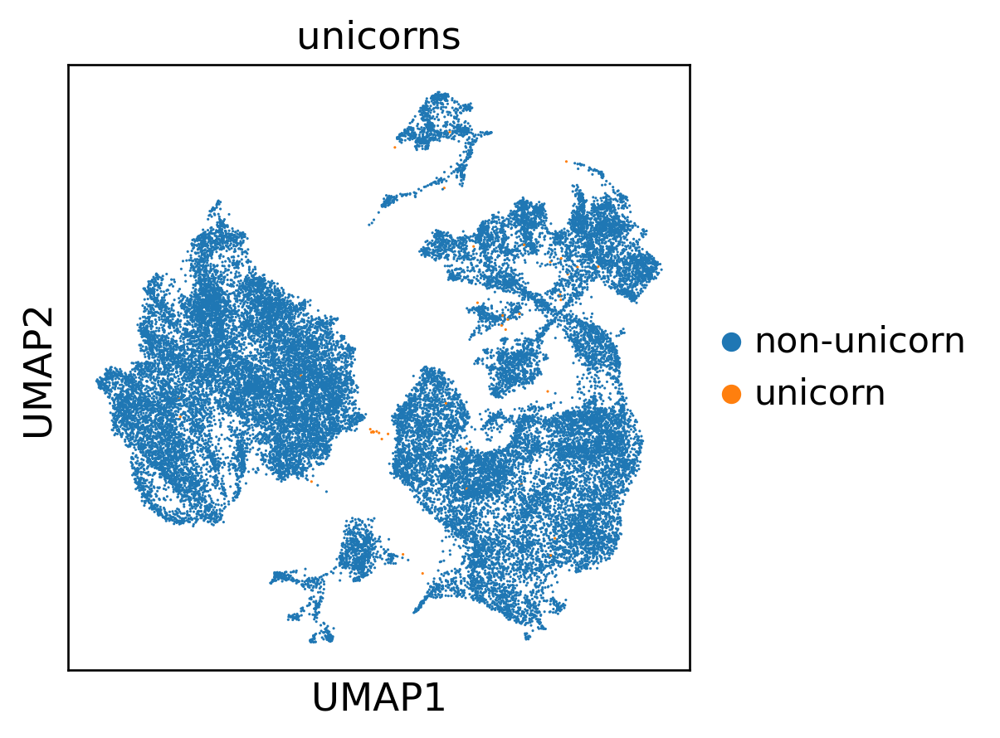

In [9]:
sc.pl.umap(adata, color=['unicorns'])

In [10]:
# remove cells with with low frequency
df_counts = pd.crosstab(adata.obs['reanno'], adata.obs['stage']).reset_index()
df_counts = pd.melt(df_counts, id_vars=['reanno'], var_name='stage', value_name='Freq')

# check rows where Freq <= 4
low_count_rows = df_counts[df_counts['Freq'] <= 4]

low_count_rows



,reanno,stage,Freq
1,CTBs,E6,0
2,STBs_1,E6,1
3,STBs_2,E6,0
4,STBs_3,E6,0
5,EVTs_1,E6,3
...,...,...,...
515,YS.mesoderm,CS10,1
516,Exe.endothelium,CS10,0
518,Amniotic_epi,CS10,0
519,Ectoderm,CS10,0


In [11]:
# Combine 'reanno' and 'stage' into a single annotation for filtering
adata.obs['combined_annotation'] = adata.obs['reanno'].astype(str) + "_" + adata.obs['stage'].astype(str)

# Create a list of combined annotations to remove
annotations_to_remove = low_count_rows.apply(lambda row: f"{row['reanno']}_{row['stage']}", axis=1).tolist()

# Identify cells that match the annotations to remove
cells_to_remove = adata.obs['combined_annotation'].isin(annotations_to_remove)


# Update 'unicorns' column: if a cell matches the annotations to remove, set it to 'unicorns'
# Keep existing 'unicorns' labels and only add new ones
adata.obs.loc[cells_to_remove, 'unicorns'] = 'unicorn'

# Optional: You can ensure that cells not in the annotations_to_remove list keep their previous labels
# Uncomment the following line if you want to ensure 'unicorns' label is kept only for relevant cells
# adata.obs.loc[~cells_to_remove, 'unicorns'] = adata.obs.loc[~cells_to_remove, 'unicorns']


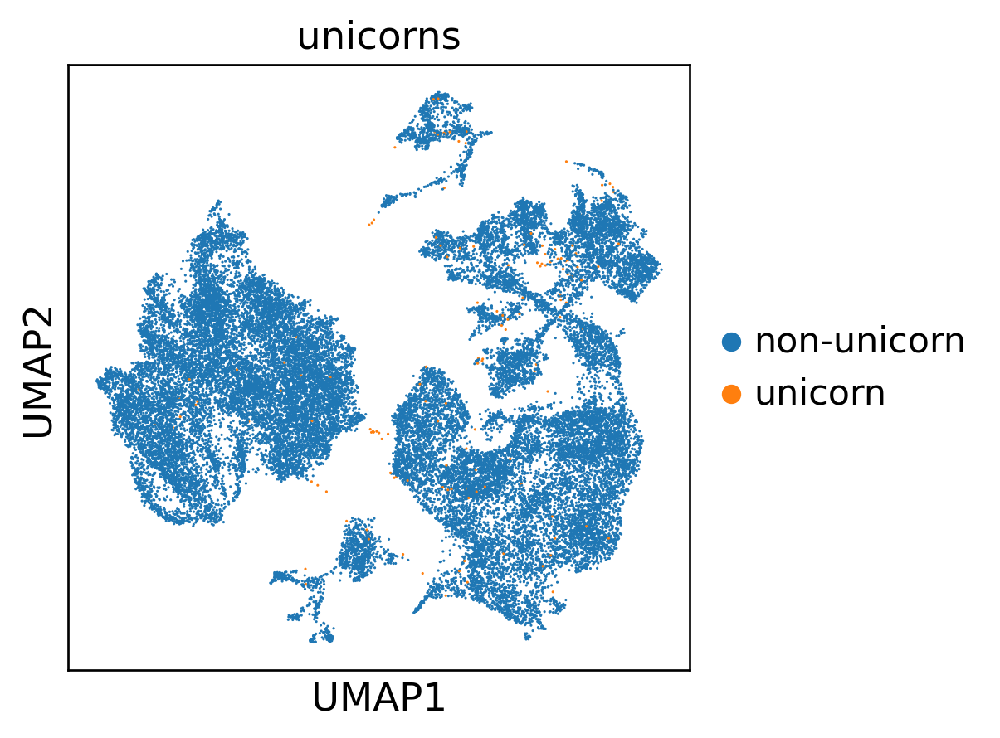

In [12]:
sc.pl.umap(adata, color=['unicorns'])

In [13]:
# subset the AnnData object to remove "unicorns"
adata = adata[adata.obs['unicorns'] == 'non-unicorn'].copy()

In [14]:
adata

AnnData object with n_obs × n_vars = 33443 × 60421
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'sample', 'stage', 'percent.mt', 'species', 'embryo', 'platform', 'ann_level_2', 'ann_level_3', 'ann_level_1', 'doublet', 'doublet_score', 'Unintegrated_res_0.5', 'Scanorama_res_0.5', 'LIGER_res_0.5', 'Harmony_res_0.5', 'scVI_res_0.5', 'scANVI_res_0.5', 'CCA_res_0.5', 'FastMNN_res_0.5', 'leiden_1', 'leiden_2', 'leiden_3', 'leiden_4', 'reanno', 'lineage', 'unicorns', 'combined_annotation'
    var: 'features', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'highly_variable_nbatches', 'highly_variable_intersection'
    uns: 'CCA_res_0.5_colors', 'FastMNN_res_0.5_colors', 'Harmony_res_0.5_colors', 'LIGER_res_0.5_colors', 'Scanorama_res_0.5_colors', 'Unintegrated_res_0.5_colors', 'anno_colors', 'harmo.anno_colors', 'hvg', 'leiden', 'leiden_3_colors', 'log1p', 'neighbors', 'orig.ident_colors', 'pca', 'scANVI_res_0.5_colors', 'scVI_res_0.5_colors', 'stage_colors',

In [15]:
set(adata.obs.unicorns)

{'non-unicorn'}

In [16]:
# remove cells with conflicting annotations
df_counts = pd.crosstab(adata.obs['reanno'], adata.obs['orig.ident']).reset_index()
df_counts = pd.melt(df_counts, id_vars=['reanno'], var_name='orig.ident', value_name='Freq')

# Filter to find rows where Freq <= 4
low_count_rows = df_counts[df_counts['Freq'] <= 5]

# Combine 'reanno' and 'stage' into a single annotation for filtering
adata.obs['combined_annotation'] = adata.obs['reanno'].astype(str) + "_" + adata.obs['orig.ident'].astype(str)

# Create a list of combined annotations to remove
annotations_to_remove = low_count_rows.apply(lambda row: f"{row['reanno']}_{row['orig.ident']}", axis=1).tolist()

# Identify cells that match the annotations to remove
cells_to_remove = adata.obs['combined_annotation'].isin(annotations_to_remove)

# Add 'unicorn' as a category if it's not already in the categories
if 'unicorn' not in adata.obs['unicorns'].cat.categories:
    adata.obs['unicorns'] = adata.obs['unicorns'].cat.add_categories(['unicorn'])
    
# Update 'unicorns' column: if a cell matches the annotations to remove, set it to 'unicorns'
# Keep existing 'unicorns' labels and only add new ones
adata.obs.loc[cells_to_remove, 'unicorns'] = 'unicorn'

# Optional: You can ensure that cells not in the annotations_to_remove list keep their previous labels
# Uncomment the following line if you want to ensure 'unicorns' label is kept only for relevant cells
# adata.obs.loc[~cells_to_remove, 'unicorns'] = adata.obs.loc[~cells_to_remove, 'unicorns']


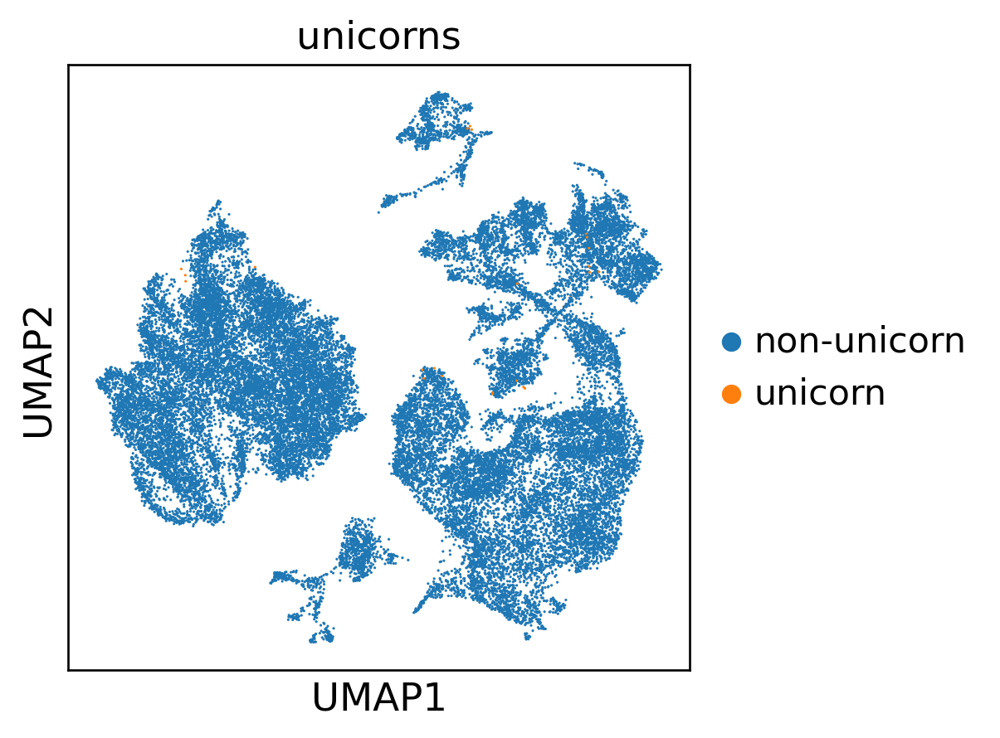

In [17]:
sc.pl.umap(adata, color=['unicorns'])

In [18]:
# subset the AnnData object to remove "unicorns"
adata = adata[adata.obs['unicorns'] == 'non-unicorn'].copy()

In [19]:
adata

AnnData object with n_obs × n_vars = 33412 × 60421
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'sample', 'stage', 'percent.mt', 'species', 'embryo', 'platform', 'ann_level_2', 'ann_level_3', 'ann_level_1', 'doublet', 'doublet_score', 'Unintegrated_res_0.5', 'Scanorama_res_0.5', 'LIGER_res_0.5', 'Harmony_res_0.5', 'scVI_res_0.5', 'scANVI_res_0.5', 'CCA_res_0.5', 'FastMNN_res_0.5', 'leiden_1', 'leiden_2', 'leiden_3', 'leiden_4', 'reanno', 'lineage', 'unicorns', 'combined_annotation'
    var: 'features', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'highly_variable_nbatches', 'highly_variable_intersection'
    uns: 'CCA_res_0.5_colors', 'FastMNN_res_0.5_colors', 'Harmony_res_0.5_colors', 'LIGER_res_0.5_colors', 'Scanorama_res_0.5_colors', 'Unintegrated_res_0.5_colors', 'anno_colors', 'harmo.anno_colors', 'hvg', 'leiden', 'leiden_3_colors', 'log1p', 'neighbors', 'orig.ident_colors', 'pca', 'scANVI_res_0.5_colors', 'scVI_res_0.5_colors', 'stage_colors',

In [20]:
#check annotations by stage
df = pd.crosstab(adata.obs['orig.ident'], adata.obs['reanno']).reset_index()
df = df.melt(id_vars='orig.ident', var_name='reanno', value_name='Freq')

# Remove rows where 'Freq' is 0
df = df[df['Freq'] != 0]

# Set display options to show all rows and columns
pd.set_option('display.max_rows', None)  # Show all rows
pd.set_option('display.max_columns', None)  # Show all columns

# Print the DataFrame
print(df)

orig.ident                             reanno  Freq
3        xiang                                 TE    52
5         zhou                                 TE   563
6           Ai                               CTBs   221
7         mole                               CTBs  1765
9        xiang                               CTBs    88
11        zhou                               CTBs  2206
12          Ai                             STBs_1   420
13        mole                             STBs_1   803
15       xiang                             STBs_1    59
17        zhou                             STBs_1   250
18          Ai                             STBs_2   287
19        mole                             STBs_2  1343
21       xiang                             STBs_2    11
23        zhou                             STBs_2    31
24          Ai                             STBs_3  1250
25        mole                             STBs_3   687
27       xiang                             STBs_3    46
29        zhou                             STBs_3   374
30          Ai                             EVTs_1  1549
31        mole                             EVTs_1   232
33       xiang                             EVTs_1    56
35        zhou                             EVTs_1   344
36          Ai                             EVTs_2  2128
37        mole                             EVTs_2    16
39       xiang                             EVTs_2    38
45       xiang                              Epi_1    35
48          Ai                              Epi_2   246
49        mole                              Epi_2   146
50       tyser                              Epi_2    59
51       xiang                              Epi_2    41
53        zhou                              Epi_2   277
54          Ai                              Epi_3  1157
55        mole                              Epi_3    46
56       tyser                              Epi_3    17
57       xiang                              Epi_3    31
60          Ai                              Epi_4   132
61        mole                              Epi_4    13
62       tyser                              Epi_4    25
66          Ai                   Primitive.streak    61
68       tyser                   Primitive.streak     6
69       xiang                   Primitive.streak     8
74       tyser                          Notochord    30
76        zeng                          Notochord    62
80       tyser                                PGC     8
86       tyser                   Nascent mesoderm    78
88        zeng                   Nascent mesoderm   675
90          Ai                          Hypoblast    30
91        mole                          Hypoblast   114
93       xiang                          Hypoblast    17
95        zhou                          Hypoblast   158
96          Ai                                AVE   158
97        mole                                AVE    40
99       xiang                                AVE    11
101       zhou                                AVE    21
102         Ai                              VE/YE   103
110      tyser                        YS.Endoderm    30
114         Ai                Exe.meso progenitor   179
116      tyser                Exe.meso progenitor     6
117      xiang                Exe.meso progenitor    10
120         Ai                        YS.mesoderm   629
123      xiang                        YS.mesoderm    11
126         Ai                    Exe.endothelium     8
134      tyser                             Amnion    38
136       zeng                             Amnion   240
138         Ai                       Amniotic_epi    53
140      tyser                       Amniotic_epi    16
146      tyser                           Ectoderm   113
154       zeng                       Neural crest   361
160       zeng                      Neural tube_1   931
164      tyser                      Neural tube_2     9
166       zeng              

In [21]:
#dot plot
meso_marker_genes = {
    "Primitive.streak": ["TBXT", "SP5", "HOXA1", "CDX1", "CDX2","MIXL1", "FST" ],
    "meso.general":["PDGFRA", "MESP1",  "GATA6",],
    "emergent.meso": ["LEFTY2", "OTX2","LHX1" ],
    "Nascent.meso":["TBX6","MEIS1",],
    "Notochord":["CHRD", "NOTO"],
    "Axial.meso": ["DCLK1", "ESRG",],
    "Paraxial.meso":["MSGN1", "HES7", ],
    "Caudal.meso":[ "SFRP2", "HOXA1"],
    "Rostral.meso":[ "PITX2", "IRX3"],
    "Intermediate.meso":["PAX8", "OSR1", "EYA1", ],
    "lateral plate.meso":["HAND1", "MYL7","HAPLN1", "BMP4", "FOXF1", "SNAI2" ],
    "ExE mesoderm progenitor":["LUM", "POSTN", "IGF2", "ANXA1"],
   "YS mesoderm":[ "CREB3L1", "NR2F2", "PLAGL1", "ANXA1", "NID2"],
    #"Allantoic stalk":["CDX1", "CDX2", "FGF9", "FGF18", "SHH", "WNT5B", "MDK"],

   # "myocyte": ["PITX2", "TGFBI"],
    "cardio myocyte":["TNNT2", "MYL7", "TNNI1", "MYH10"],
    "somite":["ALDH1A2",  "MEOX2", "MEOX1",  "FOXC2"],

     "ecto.epi.general":[ "POU5F1", "DNMT3B","EPCAM","CLDN6"],
    #"radial glial":["CDH2", "NES",  "FABP7", "VIM"],
     "neural.ecto":["SOX3", "PAX6", "TTYH1"],
     "neural crest":["SOX10", "MPZ", "TFAP2A"],
     "neural tube":["SOX2", "OTX2", "RFX4"],
    "proliferating.meso": ["MKI67", "TOP2A", "CDK1" ],
    #"Amniotic.ecto": ["TFAP2C", "GATA3", "MSX2",  "WNT6","DLX5",],
        "EXM": ["DEPDC1B", "FBN2", "FRMD4B", "HAND2", "OAF"],
    "Allantois": ["COL6A2", "COL6A1",  "PCOLCE", "VCAN"],
   
}

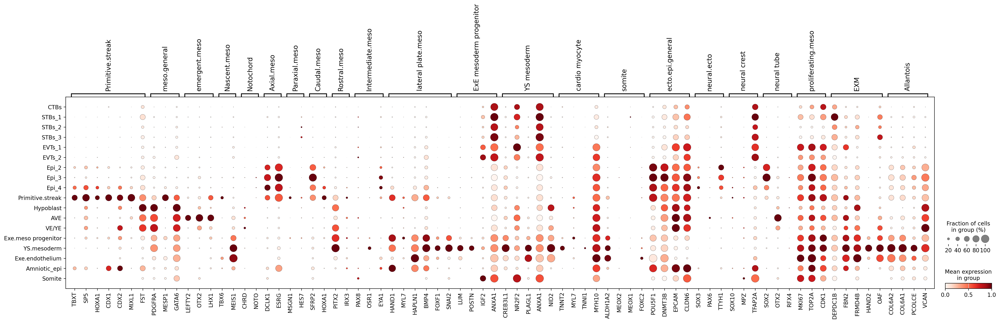

In [22]:
#check Ai somite cells
ana_sub= adata[adata.obs['orig.ident'].isin([ 'Ai'])]
sc.pl.dotplot(ana_sub, meso_marker_genes, groupby="reanno", use_raw=False, standard_scale="var")

In [23]:
#manually remove Ai somite cells
# Remove cells where 'orig.ident' is 'Ai' and 'reanno' is 'Somite'
cells_to_remove = (adata.obs['orig.ident'].isin(['Ai'])) & (adata.obs['reanno'] == 'Somite')

# Subset adata to exclude those cells
adata = adata[~cells_to_remove].copy()

In [24]:
adata

AnnData object with n_obs × n_vars = 33406 × 60421
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'sample', 'stage', 'percent.mt', 'species', 'embryo', 'platform', 'ann_level_2', 'ann_level_3', 'ann_level_1', 'doublet', 'doublet_score', 'Unintegrated_res_0.5', 'Scanorama_res_0.5', 'LIGER_res_0.5', 'Harmony_res_0.5', 'scVI_res_0.5', 'scANVI_res_0.5', 'CCA_res_0.5', 'FastMNN_res_0.5', 'leiden_1', 'leiden_2', 'leiden_3', 'leiden_4', 'reanno', 'lineage', 'unicorns', 'combined_annotation'
    var: 'features', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'highly_variable_nbatches', 'highly_variable_intersection'
    uns: 'CCA_res_0.5_colors', 'FastMNN_res_0.5_colors', 'Harmony_res_0.5_colors', 'LIGER_res_0.5_colors', 'Scanorama_res_0.5_colors', 'Unintegrated_res_0.5_colors', 'anno_colors', 'harmo.anno_colors', 'hvg', 'leiden', 'leiden_3_colors', 'log1p', 'neighbors', 'orig.ident_colors', 'pca', 'scANVI_res_0.5_colors', 'scVI_res_0.5_colors', 'stage_colors',

In [25]:
#check annotations by stage
df = pd.crosstab(adata.obs['orig.ident'], adata.obs['reanno']).reset_index()
df = df.melt(id_vars='orig.ident', var_name='reanno', value_name='Freq')

# Remove rows where 'Freq' is 0
df = df[df['Freq'] != 0]

# Set display options to show all rows and columns
pd.set_option('display.max_rows', None)  # Show all rows
pd.set_option('display.max_columns', None)  # Show all columns

# Print the DataFrame
print(df)

orig.ident                             reanno  Freq
3        xiang                                 TE    52
5         zhou                                 TE   563
6           Ai                               CTBs   221
7         mole                               CTBs  1765
9        xiang                               CTBs    88
11        zhou                               CTBs  2206
12          Ai                             STBs_1   420
13        mole                             STBs_1   803
15       xiang                             STBs_1    59
17        zhou                             STBs_1   250
18          Ai                             STBs_2   287
19        mole                             STBs_2  1343
21       xiang                             STBs_2    11
23        zhou                             STBs_2    31
24          Ai                             STBs_3  1250
25        mole                             STBs_3   687
27       xiang                             STBs_3    46
29        zhou                             STBs_3   374
30          Ai                             EVTs_1  1549
31        mole                             EVTs_1   232
33       xiang                             EVTs_1    56
35        zhou                             EVTs_1   344
36          Ai                             EVTs_2  2128
37        mole                             EVTs_2    16
39       xiang                             EVTs_2    38
45       xiang                              Epi_1    35
48          Ai                              Epi_2   246
49        mole                              Epi_2   146
50       tyser                              Epi_2    59
51       xiang                              Epi_2    41
53        zhou                              Epi_2   277
54          Ai                              Epi_3  1157
55        mole                              Epi_3    46
56       tyser                              Epi_3    17
57       xiang                              Epi_3    31
60          Ai                              Epi_4   132
61        mole                              Epi_4    13
62       tyser                              Epi_4    25
66          Ai                   Primitive.streak    61
68       tyser                   Primitive.streak     6
69       xiang                   Primitive.streak     8
74       tyser                          Notochord    30
76        zeng                          Notochord    62
80       tyser                                PGC     8
86       tyser                   Nascent mesoderm    78
88        zeng                   Nascent mesoderm   675
90          Ai                          Hypoblast    30
91        mole                          Hypoblast   114
93       xiang                          Hypoblast    17
95        zhou                          Hypoblast   158
96          Ai                                AVE   158
97        mole                                AVE    40
99       xiang                                AVE    11
101       zhou                                AVE    21
102         Ai                              VE/YE   103
110      tyser                        YS.Endoderm    30
114         Ai                Exe.meso progenitor   179
116      tyser                Exe.meso progenitor     6
117      xiang                Exe.meso progenitor    10
120         Ai                        YS.mesoderm   629
123      xiang                        YS.mesoderm    11
126         Ai                    Exe.endothelium     8
134      tyser                             Amnion    38
136       zeng                             Amnion   240
138         Ai                       Amniotic_epi    53
140      tyser                       Amniotic_epi    16
146      tyser                           Ectoderm   113
154       zeng                       Neural crest   361
160       zeng                      Neural tube_1   931
164      tyser                      Neural tube_2     9
166       zeng              

In [ ]:
# Generate and save the UMAP plot
plt.rcParams['figure.dpi'] = 300
plt.rcParams['savefig.dpi'] = 300
sc.pl.umap(adata, color=['reanno'], save='human_reanno.pdf')  # Save as PDF file

In [ ]:
sc.pl.umap(adata, color=['lineage'], save='human_lineage.pdf')

In [ ]:
sc.pl.umap(adata, color=['stage'], save='human_stage.pdf')

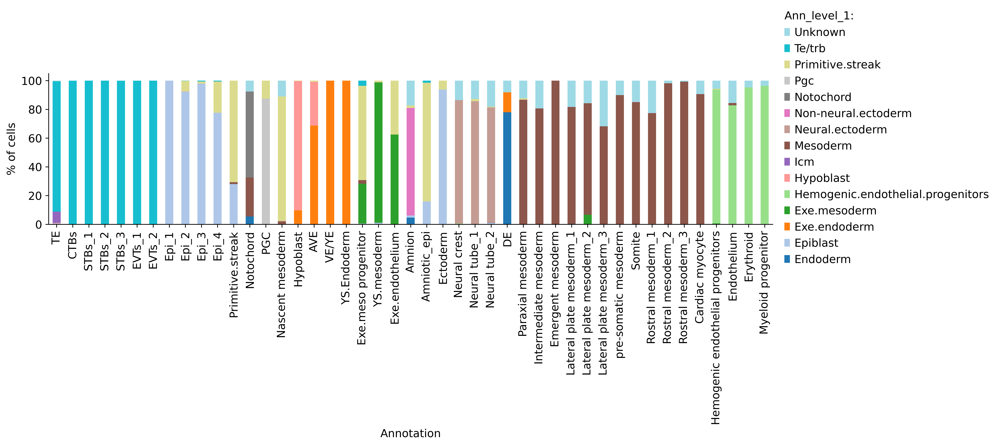

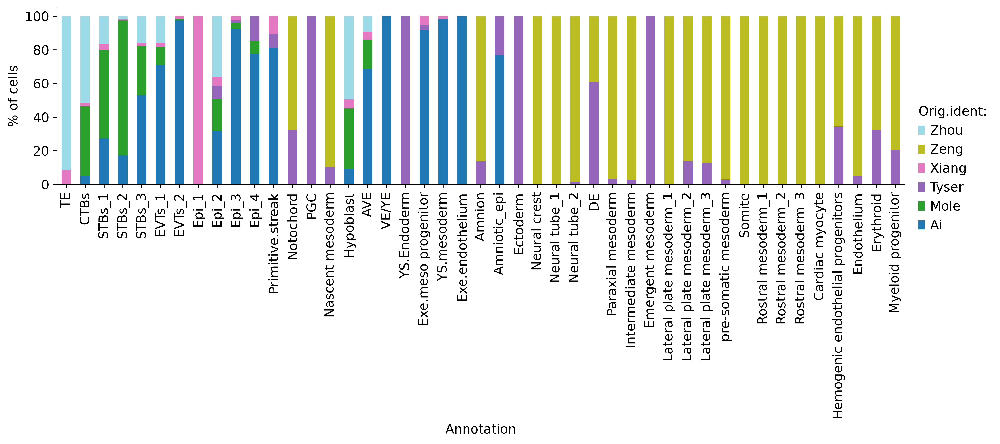

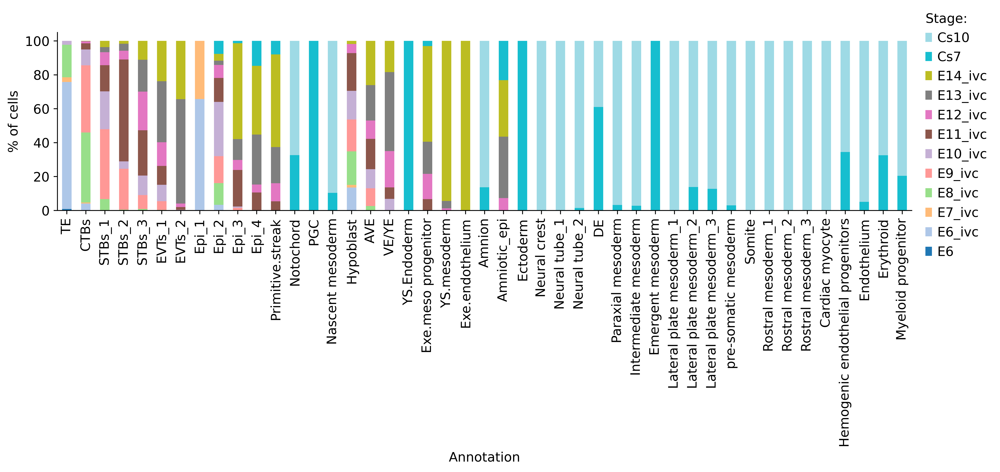

In [29]:
FIGURES = dict()
fz = 12
annos = ['ann_level_1', 'ann_level_2','ann_level_3','orig.ident', 'stage']
for x in annos:
    study_count_per_ct = pd.crosstab(adata.obs['reanno'], adata.obs[x])
    study_perc_per_ct = (
        study_count_per_ct.divide(study_count_per_ct.sum(axis=1), axis=0) * 100
    )

    with plt.rc_context(
        {
            "figure.figsize": (14, 3),
            "xtick.labelsize": fz,
            "ytick.labelsize": fz,
            "axes.labelsize": fz,
            "font.size": fz,
            "axes.spines.right": False,
            "axes.spines.top": False,
        }
    ):
        fig, ax = plt.subplots()
        study_perc_per_ct.plot(kind="bar", stacked=True, ax=ax, cmap="tab20", grid=False)
        handles, labels = ax.get_legend_handles_labels()
        labels = [lab.capitalize() for lab in labels]
        ax.legend(
            handles[::-1],
            labels[::-1],
            loc=(1.01, -0.3),
            fontsize=fz,
            frameon=False,
            title=f"{x.capitalize()}:",
        )
        leg = ax.get_legend()
        leg._legend_box.align = "left"
        plt.ylabel("% of cells")
        plt.xlabel("Annotation")
        FIGURES[f"ED_4a_cell_type_{x}"] = fig
        plt.show()

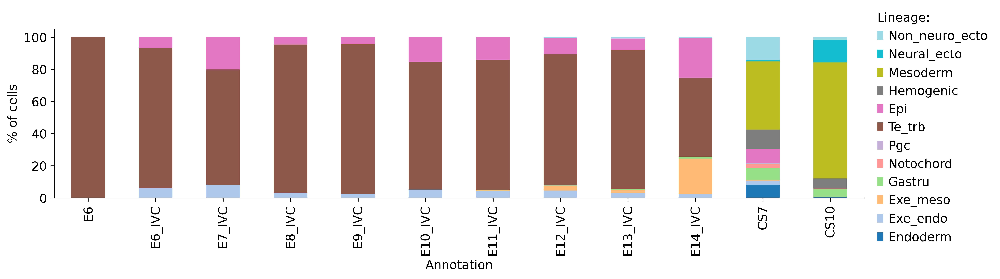

In [30]:
FIGURES = dict()
fz = 12
annos = [ 'reanno','lineage']
for x in annos:
    study_count_per_ct = pd.crosstab(adata.obs['stage'], adata.obs[x])
    study_perc_per_ct = (
        study_count_per_ct.divide(study_count_per_ct.sum(axis=1), axis=0) * 100
    )

    with plt.rc_context(
        {
            "figure.figsize": (14, 3),
            "xtick.labelsize": fz,
            "ytick.labelsize": fz,
            "axes.labelsize": fz,
            "font.size": fz,
            "axes.spines.right": False,
            "axes.spines.top": False,
        }
    ):
        fig, ax = plt.subplots()
        study_perc_per_ct.plot(kind="bar", stacked=True, ax=ax, cmap="tab20", grid=False)
        handles, labels = ax.get_legend_handles_labels()
        labels = [lab.capitalize() for lab in labels]
        ax.legend(
            handles[::-1],
            labels[::-1],
            loc=(1.01, -0.3),
            fontsize=fz,
            frameon=False,
            title=f"{x.capitalize()}:",
        )
        leg = ax.get_legend()
        leg._legend_box.align = "left"
        plt.ylabel("% of cells")
        plt.xlabel("Annotation")
        FIGURES[f"ED_4a_cell_type_{x}"] = fig
        plt.show()

In [31]:
# Obtain cluster-specific differentially expressed genes
sc.tl.rank_genes_groups(adata, groupby="lineage", method="wilcoxon",use_raw=False)
sc.tl.dendrogram(adata, groupby="lineage")

In [ ]:
sc.pl.rank_genes_groups_dotplot(adata, groupby="lineage", standard_scale="var", n_genes=5,use_raw=False, save='marker.pdf')

In [ ]:
# Obtain cluster-specific differentially expressed genes
sc.tl.rank_genes_groups(adata, groupby="reanno", method="wilcoxon",use_raw=False)
sc.tl.dendrogram(adata, groupby="reanno")
sc.pl.rank_genes_groups_dotplot(adata, groupby="reanno", standard_scale="var", n_genes=5,use_raw=False, save='marker.pdf')

In [ ]:
plt.rcParams['pdf.fonttype'] = 42  # Ensures that fonts are saved as text, not outlines
plt.rcParams['font.sans-serif'] = ['Arial']  # Use Arial or another common font
sc.pl.rank_genes_groups_dotplot(adata, groupby="reanno", standard_scale="var", n_genes=5,use_raw=False, save='marker.pdf')

findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because

In [ ]:
##save dataset
adata.raw.var.rename(columns={'_index': 'index'}, inplace=True)
adata.write_h5ad(filename="human_reanno_clean.h5ad")